In [1]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
%matplotlib inline

import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy.stats import ttest_ind , pearsonr , chi2 , kstest, ks_1samp
from scipy.stats import norm,lognorm ,genlogistic ,genexpon,gennorm,genpareto,pareto , weibull_min,t
from scipy.stats import probplot
from sklearn.linear_model import LinearRegression 
import warnings
warnings.filterwarnings('ignore')

import plotly.express as px

import folium

#pour les tableaux
import plotly.graph_objects as go

In [2]:
#Import des modules d'analyse
import sys
sys.path.append(r'C:\Users\dthem\NOTEBOOKS_python\MODULES_FONCTIONS')
import Fonction_impression_tableau_plotly as imptab
import Fonctions_analyse_statistique_univariée  as statuniv
import Fonctions_analyse_statistique_bivariée as statbiv

In [3]:
#Paramètres généraux pour les graphiques
couleur_axes="dimgray"
couleur_texte="darkslategray"
couleur_boite="gainsboro"

df_sect_couleurs=pd.DataFrame({"Secteur":["Résidentiel","Tertiaire","Industriel","Agricole","Non affecté"],
                               "Couleur":["orange","yellowgreen","gold","lime","cyan"]})


In [4]:
#Chargement des données énergie
conso_an_secteur=pd.read_csv(r"C:\DATA\énergie\conso_an_secteur.csv")

#Pas de vérification : les problèmes ont été traités dans le notebook de préparation

#Les consommations sont exprimées en MWh dans le fichier initial

In [5]:
conso_an_secteur.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 377076 entries, 0 to 377075
Data columns (total 27 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   conso_agri_elec    377076 non-null  float64
 1   conso_ter_elec     377076 non-null  float64
 2   conso_indus_elec   377076 non-null  float64
 3   conso_resid_elec   377076 non-null  float64
 4   conso_nonaff_elec  377076 non-null  float64
 5   conso_totale_elec  377076 non-null  float64
 6   conso_agri_gaz     377076 non-null  float64
 7   conso_ter_gaz      377076 non-null  float64
 8   conso_indus_gaz    377076 non-null  float64
 9   conso_resid_gaz    377076 non-null  float64
 10  conso_nonaff_gaz   377076 non-null  float64
 11  conso_totale_gaz   377076 non-null  float64
 12  conso_agri         377076 non-null  float64
 13  conso_ter          377076 non-null  float64
 14  conso_indus        377076 non-null  float64
 15  conso_resid        377076 non-null  float64
 16  co

In [6]:
#Analyse à l'échelle EPCI pour l'année 2021

In [7]:
#Prévoir un descriptif sur EPCI

In [8]:
#1ère approche 2021
conso_communes_2021=conso_an_secteur[conso_an_secteur["année"]==2021]

In [9]:
#Regroupement à l'échelle ecpi
conso_epci_2021=conso_communes_2021.groupby(['code_epci', 'nom_epci','nature_epci','nb_com'],as_index=False).agg({
        'conso_agri_elec':"sum", 'conso_ter_elec':"sum", 'conso_indus_elec':"sum", 'conso_resid_elec':"sum",
        'conso_nonaff_elec':"sum",'conso_totale_elec':"sum", 'conso_agri_gaz':"sum", 'conso_ter_gaz':"sum",
        'conso_indus_gaz':"sum", 'conso_resid_gaz':"sum", 'conso_nonaff_gaz':"sum",'conso_totale_gaz':"sum",
        'conso_agri':"sum", 'conso_ter':"sum", 'conso_indus':"sum",
       'conso_resid':"sum", 'conso_nonaff':"sum", 'conso_totale':"sum",'superficie':"sum", 'population':"sum"
})

#Attention: on supprime les départements et régions parce que les ECPI peuvent être à cheval 

In [10]:
#Ajout d'une variable densité de population
conso_epci_2021["dens_pop"]=conso_epci_2021["population"]/conso_epci_2021["superficie"]

In [11]:
#Ajouts de variables d'autres sources 

#Ajout des établissements --> source base Sirène  au 1er juillet 2023
#infos_etabl=pd.read_csv(r"C:\DATA\énergie\nb_etabl_secteur_epci.csv")
#conso_epci_2021=conso_epci_2021.merge(right=infos_etabl,on="code_epci",how="left")


In [12]:
#Valeurs manquantes
conso_epci_2021.isna().sum()

#RAS

code_epci            0
nom_epci             0
nature_epci          0
nb_com               0
conso_agri_elec      0
conso_ter_elec       0
conso_indus_elec     0
conso_resid_elec     0
conso_nonaff_elec    0
conso_totale_elec    0
conso_agri_gaz       0
conso_ter_gaz        0
conso_indus_gaz      0
conso_resid_gaz      0
conso_nonaff_gaz     0
conso_totale_gaz     0
conso_agri           0
conso_ter            0
conso_indus          0
conso_resid          0
conso_nonaff         0
conso_totale         0
superficie           0
population           0
dens_pop             0
dtype: int64

In [13]:
#Nombre d' epci
print("A l'origine ,le nombre de EPCI est: ",len(conso_epci_2021["code_epci"].unique()))

#Suppression des  lignes avec libellé_ecpi='sans intercommunalité'
conso_epci_2021=conso_epci_2021[conso_epci_2021["nom_epci"]!='sans intercommunalité']

nb_epci=len(conso_epci_2021["code_epci"].unique())
print("Le nombre final de EPCI est: ",nb_epci)

A l'origine ,le nombre de EPCI est:  1232
Le nombre final de EPCI est:  1231


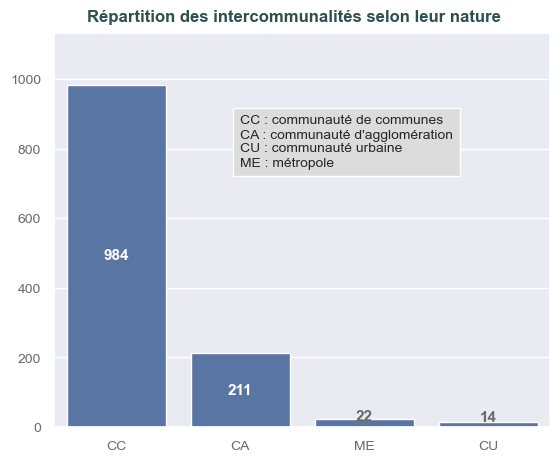

In [14]:
#Informations sur les EPCI 
#On ne rentre pas dans le détail des données EPCI ici-ce sera fait plus loin
#Il s'agit simplement d'indiquer qu'il y a différentes natures d' EPCI

"""
La métropole de Lyon, créée par la loi MAPTAM, est une collectivité territoriale et non une intercommunalité.
Elle n'est donc pas une métropole au sens de la loi de 2010. 
Elle est intégrée dans ce fichier aux EPCI avec une nature spécifique (METLYON).


Les métropoles d'Aix-Marseille-Provence et du Grand Paris sont deux métropoles à statut particulier.

"""

conso_epci_2021=conso_epci_2021.replace(to_replace="METLYON",value="ME")

#Graphique de la distribution de epci selon leur nature
fig,ax=plt.subplots()
sns.countplot(conso_epci_2021,x="nature_epci",ax=ax , color="#4c72b0")
plt.xticks(color=couleur_axes,size=10)
plt.yticks(color=couleur_axes,size=10)
ech=0
i=0
for p in ax.patches: 
        i+=1
        val=p.get_height()
        if val>ech:
            ech=val
        if i<=2:    
            ax.text(p.get_x()+ p.get_width()/2.,val/2,
                '{}'.format(int(val)), 
                fontsize=11,weight="bold",color='white',ha='center',va='center')
        else:
            ax.text(p.get_x()+ p.get_width()/2.,val/2,
                '{}'.format(int(val)), 
                fontsize=11,weight="bold",color='dimgray',ha='center',va='bottom')
ech=ech*1.15
plt.ylim([0,ech])
plt.xlabel("")
plt.ylabel("");


texte1="CC : communauté de communes"
texte2="CA : communauté d'agglomération"
texte3="CU : communauté urbaine"
texte4="ME : métropole"

texte=texte1+"\n"+texte2+"\n"+texte3+"\n"+texte4
plt.text(1,750,texte,fontweight = 'light', bbox={'facecolor': couleur_boite, 'alpha': 1, 'pad': 5} ,size=10);

plt.subplots_adjust(top=0.93)
plt.suptitle("Répartition des intercommunalités selon leur nature",color=couleur_texte,size=12,weight="bold");


#Image
fig.savefig("énergie_graphe_1") 


In [15]:
#Introduction de variables pour les graphes et les tests statistiques
#Dataframe de nom_secteur et dataframe de nom de nature_epci 
df_defsecteur=pd.DataFrame({"ratio":["r_resid","r_ter","r_indus","r_agri","r_nonaff"],
                        "secteur":["Résidentiel","Tertiaire","Industriel","Agricole","Non affecté"]})

df_epci=pd.DataFrame({"nature_epci":["CC","CA","CU","ME"],
                        "nom_nature_epci":["Communauté de communes","Communauté d'agglomération","Communauté urbaine","Métropole"]})

#Liste pour l'ordre de nature epci dans les graphes
ordre_epci=["CC","CA","CU","ME"]

#Ajout d'une variable , nécessaire pour les tests ANOVA
conso_epci_2021["num_nature_epci"]=conso_epci_2021["nature_epci"].apply(lambda x: 1 if x=="CC" else 2 if x=="CA" else 3 if x=="CU" else 4)

#Renommage de colonnes pour les tests

conso_epci_2021=conso_epci_2021.rename({"Santé et action sociale":"Santé_et_action_sociale",
                                    "Services aux particuliers":"Services_aux_particuliers",
                                    "Sports, loisirs et culture":"Sports_loisirs_culture",
                                    "Transports et déplacements":"Transports_et_déplacements"},axis=1)

In [16]:
#Ajout de ratios de décomposition de la consommation totale sur les 5 secteurs considérés
conso_epci_2021["r_resid"]=conso_epci_2021["conso_resid"]/conso_epci_2021["conso_totale"]*100
conso_epci_2021["r_indus"]=conso_epci_2021["conso_indus"]/conso_epci_2021["conso_totale"]*100
conso_epci_2021["r_ter"]=conso_epci_2021["conso_ter"]/conso_epci_2021["conso_totale"]*100
conso_epci_2021["r_agri"]=conso_epci_2021["conso_agri"]/conso_epci_2021["conso_totale"]*100
conso_epci_2021["r_nonaff"]=conso_epci_2021["conso_nonaff"]/conso_epci_2021["conso_totale"]*100

In [17]:
#les variables de consommation sont passées en GWh
for var in conso_epci_2021.columns[4:22]:
    conso_epci_2021[var]=conso_epci_2021[var].apply(lambda x:x/1000)

In [18]:
#A Statistiques descriptives de la consommation d'énergie

In [19]:
#Graphes de la consommation totale par secteur


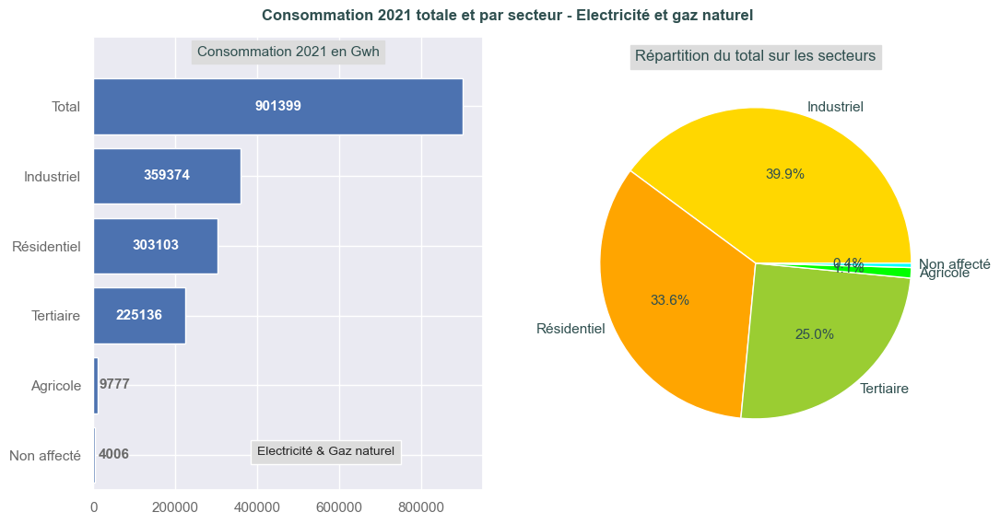

In [20]:
#Graphe 2

fig=plt.figure(figsize=(12,6))
df_total=pd.DataFrame({"Total":conso_epci_2021["conso_totale"].sum(),
                       "Résidentiel":conso_epci_2021["conso_resid"].sum(),
                       "Tertiaire":conso_epci_2021["conso_ter"].sum(),
                       "Industriel":conso_epci_2021["conso_indus"].sum(),
                       "Agricole":conso_epci_2021["conso_agri"].sum(),
                       "Non affecté":conso_epci_2021["conso_nonaff"].sum()
                      },index=[0])

df_total=df_total.T.reset_index(drop=False)
df_total=df_total.rename({"index":"Secteur",0:"Consommation en Gwh"},axis=1)
df_total=df_total.sort_values(by="Consommation en Gwh",ascending=True)

graf=plt.subplot(1,2,1)
graf.barh(df_total["Secteur"],df_total["Consommation en Gwh"])
i=-1
for p in graf.patches: 
        i+=1
        val=p.get_width()
        if i>=2:    
            graf.text(val/2,i,
             '{}'.format(int(val)), fontsize=11,weight="bold",color='white',ha='center',va='center')
        else:
            graf.text(val/2+10000,i,
                '{}'.format(int(val)), fontsize=11,weight="bold",color='dimgray',ha='left',va='center')


plt.title("Consommation 2021 en Gwh",color=couleur_texte,size=11,pad=-15,backgroundcolor=couleur_boite)

texte="Electricité & Gaz naturel"
plt.text(400000,0,texte,fontweight = 'light', bbox={'facecolor': couleur_boite, 'alpha': 1, 'pad': 5} ,size=10);
plt.xticks(color=couleur_axes,size=11)
plt.xlabel("")
plt.xlim([0,950000])
plt.yticks(color=couleur_axes,size=11)
plt.ylim([-0.5,6])
plt.ylabel("");

plt.subplot(1,2,2)
df_pie=df_total[df_total["Secteur"]!="Total"]
df_pie=df_pie.merge(right=df_sect_couleurs,on="Secteur",how="left")
df_pie=df_pie.sort_values(by="Consommation en Gwh",ascending=False).reset_index(drop=True)
labelx=df_pie["Secteur"]
def func(pct, valeurs):
    #absolute = int(np.round(pct/100.*np.sum(valeurs)))
    return f"{pct:.1f}%"

valeurs=df_pie["Consommation en Gwh"]
plt.pie(valeurs,labels=df_pie["Secteur"],colors=df_pie["Couleur"],
         autopct=lambda pct: func(pct, valeurs),labeldistance=1.05,startangle=0,
         pctdistance=0.60,textprops={"size":11,"color":couleur_texte})
plt.title("Répartition du total sur les secteurs",color=couleur_texte,size=12,backgroundcolor=couleur_boite)

plt.subplots_adjust(top=0.93)
plt.suptitle("Consommation 2021 totale et par secteur - Electricité et gaz naturel",color=couleur_texte,size=12,weight="bold");

#Image
fig.savefig("énergie_graphe_2") 

In [21]:
#Graphes de la consommation totale par type d'EPCI et secteur

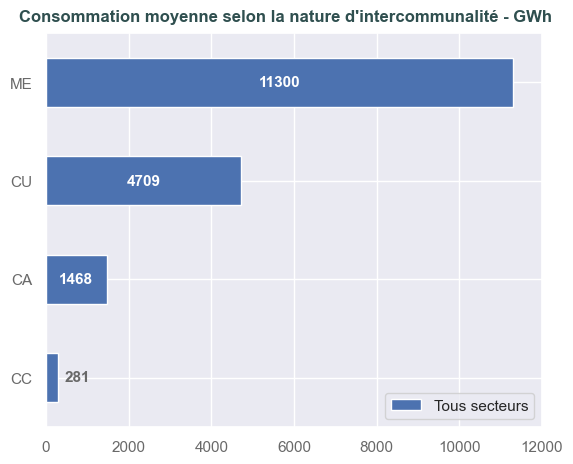

In [22]:
#Graphe 3
#Consommation en GWH par nature d'EPCI
df_nature_epci=conso_epci_2021.groupby(["nature_epci"],as_index=False).agg({'conso_totale':"mean",'conso_agri':"mean", 'conso_ter':"mean",
       'conso_indus':"mean", 'conso_resid':'mean', 'conso_nonaff':"mean"})

df_nature_epci=df_nature_epci.rename({'conso_totale':"Tous secteurs",'conso_agri':"Agricole", 'conso_ter':"Tertiaire",
       'conso_indus':"Industriel", 'conso_resid':'Résidentiel', 'conso_nonaff':"Non affecté"},axis=1)

df_nature_epci=df_nature_epci.set_index("nature_epci")
df_nature_epci=df_nature_epci.reindex(["CC","CA","CU","ME"])
df_nature_epci=df_nature_epci.reset_index(drop=False)

fig=plt.figure()
ax=fig.subplots()
couleurs=["orange","yellowgreen","gold","lime","cyan"]

df_nature_epci.plot.barh(x="nature_epci",y="Tous secteurs",rot=0,ax=ax)
i=-1
for p in ax.patches: 
        i+=1
        val=p.get_width()
        if i>=1:    
            ax.text(val/2,i,
             '{}'.format(int(val)), fontsize=11,weight="bold",color='white',ha='center',va='center')
        else:
            ax.text(val/2+300,i,
                '{}'.format(int(val)), fontsize=11,weight="bold",color='dimgray',ha='left',va='center')

plt.title("")
plt.xlim([0,12000])
plt.xticks(color=couleur_axes,size=11)
plt.yticks(color=couleur_axes,size=11)
plt.ylim([-0.5,3.5])
plt.ylabel("");

plt.subplots_adjust(top=0.93)
plt.suptitle("Consommation moyenne selon la nature d'intercommunalité - GWh",color=couleur_texte,size=12,weight="bold");


#1-Ce graphe suggère des répartitions entre secteurs différentes selon la nature d' epci
#2-On note des totaux ME/CA/CC pas très différents alors que les nombres d'epci correspondants sont très
#différents

#Image
fig.savefig("énergie_graphe_3") 

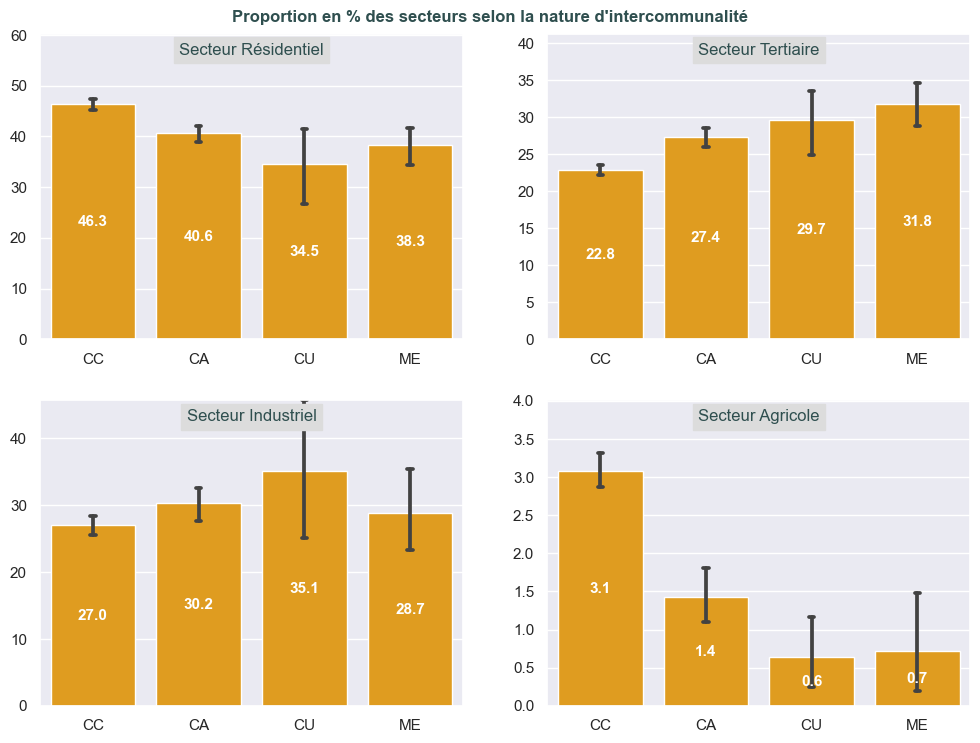

In [23]:
#Graphe 4 - proportion des sevteurs en fonction de la nature d'epci
fig, ax = plt.subplots(figsize=(12,8))
ax.yaxis.set_visible(False)
ax.xaxis.set_visible(False)
ax.set_axis_off()
nb_rg=2
nb_col=2
df=conso_epci_2021
variables=['r_resid', 'r_ter', 'r_indus', 'r_agri', 'r_nonaff'] 

for i in range(4):
    ax = fig.add_subplot(nb_rg, nb_col, i+1)
    var=variables[i]
    sns.barplot(data=df,x="nature_epci",y=var,color="orange",ax=ax,errorbar="ci",capsize=0.05,order=ordre_epci)
    titre ="Secteur " +str(df_defsecteur[df_defsecteur["ratio"]==var].iat[0,1])
    ax.set_title(titre,fontdict={'fontsize':12,'color':couleur_texte},pad=-15,backgroundcolor=couleur_boite)
    plt.xlabel("")
    plt.ylabel("")
    ech=0
    for p in ax.patches: 
        val=p.get_height()
        if val>ech:
            ech=val
        ax.text(p.get_x()+ p.get_width()/2.,
            val/2,
            '{}'.format(val.round(1)), 
            fontsize=11,weight="bold",
            color='white',
            ha='center',
            va='center')
    ech*=1.3
    plt.ylim([0,ech])
                       
plt.subplots_adjust(top=0.95)
plt.suptitle("Proportion en % des secteurs selon la nature d'intercommunalité",color=couleur_texte,size=12,weight="bold");
#graphe 9

#Sur les graphes les barres correspondent à l'intervalle de confiance à 95% sur les moyennes
#On note le fort intervalle pour les intercommunalités de type CU dans le cas du secteur industriel

#conso secteur tertiaire clairement liée à la nature d'EPCI
#conso secteur agricole : idemdans l'autre sens avec un grois écart entre CC et le reste
#conso secteur résidentiel : CC au dessus des autres

#conso secteur industriel : pas d'effet 

#prévoir si nécessaire des tests de comparaison 2 à 2

#Image
fig.savefig("énergie_graphe_4") 

In [24]:
#Boucle analyse bivariée quali-quanti
df=conso_epci_2021
variables=['r_resid', 'r_ter', 'r_indus', 'r_agri']
var1="nature_epci"
for j in range(len(variables)):
    var2=variables[j]
    if j==0:
        test_secteur_type=statbiv.analyse_quali_quanti(df,var1,var2)      
    else:
        test_secteur_type=pd.concat([test_secteur_type,statbiv.analyse_quali_quanti(df,var1,var2)],axis=0)


In [25]:
#Modification du dataframe des résultats
#Réindexer , renommer la colonne variable
#renommer les valeurs de cette colonne
#On ne conserve que la partie "test de comparaison"

test_secteur_type=test_secteur_type[["Test de comparaison"]]
test_secteur_type=test_secteur_type.reset_index()
test_secteur_type=test_secteur_type.rename({"Variables":"Secteur"},axis=1)



test_secteur_type["Secteur"]=test_secteur_type["Secteur"].replace(to_replace=["nature_epci & r_resid","nature_epci & r_ter","nature_epci & r_indus","nature_epci & r_agri"],
                       value=["Résidentiel","Tertiaire","Industriel","Agricole"])



In [26]:
#On déplie la colonne "Test de comparaison"
nouv_colonnes=list(test_secteur_type["Test de comparaison"][0].columns)

for var in nouv_colonnes:
    valeurs=[]
    for i in range(len(test_secteur_type)):
        valeurs.append(test_secteur_type["Test de comparaison"][i][var][0])
    
    test_secteur_type[var]=valeurs 
    
#On nettoie : suppression des colonnes "Test de comparaison" et "Modalités"
test_secteur_type=test_secteur_type.drop(["Test de comparaison","Modalités","Significativité"],axis=1)

#Mise au format des colonnes numériques
test_secteur_type["Stat"]=test_secteur_type["Stat"].round(1)
test_secteur_type["p-value"]=test_secteur_type["p-value"].apply(lambda x:'{:.2e}'.format(x))

In [27]:
#Visualisation du tableau
test_secteur_type

,Secteur,Test réalisé,Stat,p-value,Relation,Normalité,Egalité des var.
0,Résidentiel,Kruskal-Wallis,41.2,5.80e-09,Oui,Non,Non
1,Tertiaire,Kruskal-Wallis,81.3,1.59e-17,Oui,Non,Oui
2,Industriel,Kruskal-Wallis,17.2,6.51e-04,Oui,Non,Non
3,Agricole,Kruskal-Wallis,149.1,4.15e-32,Oui,Non,Non


In [28]:
#Impression image
image=imptab.impression_tableau(test_secteur_type,"Test des relations entre les ratios des secteurs et le type d'intercommunalité")
image.write_image("énergie_tabl1.png")

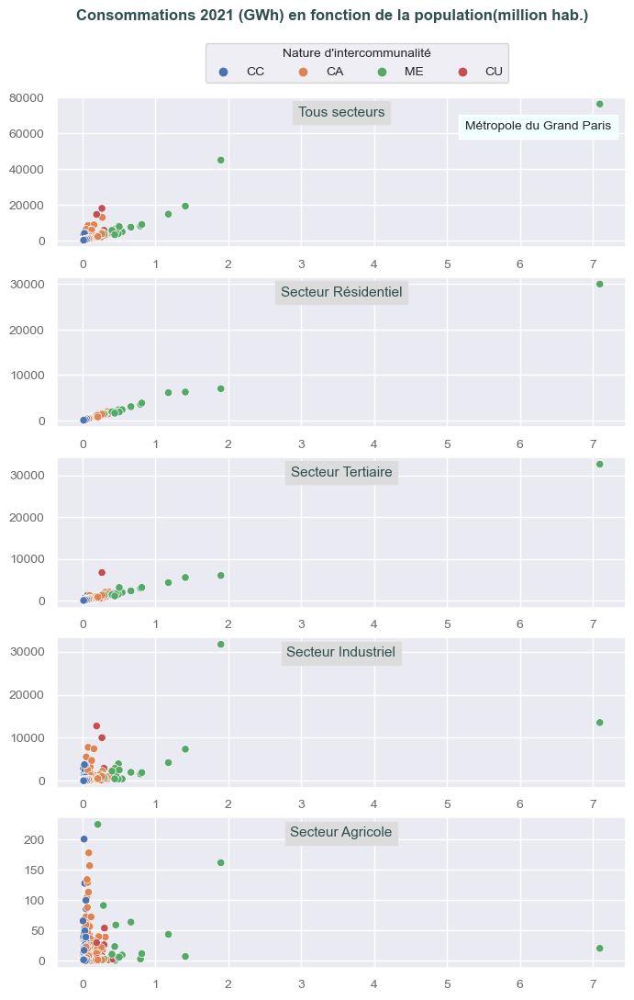

In [52]:
#Graphes globaux - les consommations en fonction de la population par nature d'epci
df=conso_epci_2021
nlig=5
ncol=1
fig,ax=plt.subplots(nlig,ncol,figsize=(8,12))
variables=["conso_totale","conso_resid","conso_ter","conso_indus","conso_agri"]
labels=["-","Résidentiel","Tertiaire","Industriel","Agricole"]
var_x="population"

for i in range(len(variables)):
    var_y=variables[i]
    k=int(i/ncol)
    l=np.mod(i,ncol)
    #graf=ax[k][l]
    graf=ax[k]
    if i==0:
        sns.scatterplot(df,x=var_x,y=var_y,color='#4c72b0',hue="nature_epci",ax=graf)
        sns.move_legend(graf,bbox_to_anchor=(.25, 1.40),loc="upper left", ncol=4, title="Nature d'intercommunalité",fontsize=10,
                       title_fontproperties={"size":10 })
        graf.set_title("Tous secteurs",color=couleur_texte,size=11,pad=-15,backgroundcolor=couleur_boite)
        texte5='Métropole du Grand Paris'
        graf.text(5250000,62000,texte5,fontweight = 'light',
             bbox={'facecolor': 'azure', 'alpha': 1, 'pad': 5} ,size=10);
    else:    
        sns.scatterplot(df,x=var_x,y=var_y,color='#4c72b0',hue="nature_epci",legend=False,ax=graf)
        graf.set_title("Secteur "+labels[i],color=couleur_texte,size=11,pad=-15,backgroundcolor=couleur_boite)
        
    graf.set_xlabel("")    
    graf.set_ylabel("")
    graf.set_xticklabels(["x","0","1","2","3","4","5","6","7"],color=couleur_axes,size=10)
    plt.draw()
    labely=[item.get_text() for item in graf.get_yticklabels(which='both')]
    graf.set_yticklabels(labely,color=couleur_axes,size=10)
    
plt.subplots_adjust(top=0.90)
plt.suptitle("Consommations 2021 (GWh) en fonction de la population(million hab.)",color=couleur_texte,size=12,weight="bold");

#Image
fig.savefig("énergie_graphe_5") 

In [30]:
#verification des correlations - pb de la distribution des populations qui n'est pas normale 
#df=conso_epci_2021[conso_epci_2021["nom_epci"]!='Métropole du Grand Paris']
df=conso_epci_2021
var_cible="population"
variables=["conso_totale","conso_resid","conso_ter","conso_indus","conso_agri"]

coeffcorr=[]
pval=[]
for var in variables:  #adapter selon variables explicatives prises en compte
    test=pearsonr(df[var_cible],df[var])
    coeffcorr.append(test[0].round(3))
    pval.append(test[1].round(4))
corr_cible=pd.DataFrame({"variable":variables,"correlation":coeffcorr,"p-value":pval}) 
corr_cible["val_abs"]=corr_cible["correlation"].abs()
corr_cible=corr_cible.sort_values(by="val_abs",ascending=False).reset_index(drop=True).drop("val_abs",axis=1).head(20) 
corr_cible

,variable,correlation,p-value
0,conso_resid,0.997,0.0
1,conso_ter,0.980,0.0
2,conso_totale,0.929,0.0
3,conso_indus,0.549,0.0
4,conso_agri,0.146,0.0


In [31]:
#Boucle simple d'analyse bivariée quanti-quanti
#1 seule variable avec l'ensemble des autres

df=conso_epci_2021

variables=["conso_totale","conso_resid","conso_ter","conso_indus","conso_agri"]
var1="population"
for j in range(len(variables)):
    var2=variables[j]
    if j==0:
        corr_conso_pop=statbiv.analyse_quanti_quanti(df,var1,var2)      
    else:
        corr_conso_pop=pd.concat([corr_conso_pop,statbiv.analyse_quanti_quanti(df,var1,var2)],axis=0)

#Reécriture
corr_conso_pop=corr_conso_pop.reset_index()
corr_conso_pop=corr_conso_pop.rename({"Variables":"Secteur"},axis=1)



corr_conso_pop["Secteur"]=corr_conso_pop["Secteur"].replace(to_replace=["population & conso_totale","population & conso_resid",
                                                                        "population & conso_ter", "population & conso_indus","population & conso_agri"],
                       value=["Total","Résidentiel","Tertiaire","Industriel","Agricole"])

        

In [32]:
#Traitement à faire : pour chaque Test de corrélation isoler la ligne de corrélation max 
#Puis modifier le dataframe de manière à avoir uniquement le test retenu pour chaque modalité de Secteur

for i in corr_conso_pop.index:
    corr_conso_pop["Test de corrélation"][i]=corr_conso_pop["Test de corrélation"][i].sort_values(by="Corrélation",axis=0, ascending=False,ignore_index=True)

#Modification    
nouv_colonnes=list(corr_conso_pop["Test de corrélation"][0].columns)

for var in nouv_colonnes:
    valeurs=[]
    for i in range(len(corr_conso_pop)):
        valeurs.append(corr_conso_pop["Test de corrélation"][i][var][0])
    
    corr_conso_pop[var]=valeurs 
    
#On nettoie : suppression des colonnes "Test de corrélation" et "Graphique"
corr_conso_pop= corr_conso_pop.drop(["Test de corrélation","Graphique"],axis=1)

#Mise au format des colonnes numériques
corr_conso_pop["Corrélation"]=corr_conso_pop["Corrélation"].round(3)    

In [33]:
#Visualisation du tableau
corr_conso_pop

,Secteur,Type,Corrélation,P-value,Interprétation,Significativité
0,Total,Pearson,0.929,0.0,Très forte,Oui
1,Résidentiel,Pearson,0.997,0.0,Très forte,Oui
2,Tertiaire,Pearson,0.980,0.0,Très forte,Oui
3,Industriel,Spearman,0.738,0.0,Forte,Oui
4,Agricole,Spearman,0.423,0.0,Modérée,Oui


In [34]:
#Impression image tableau correlation
image=imptab.impression_tableau(corr_conso_pop,"Corrélation entre consommation par secteur et population")
image.write_image("énergie_tabl2.png")

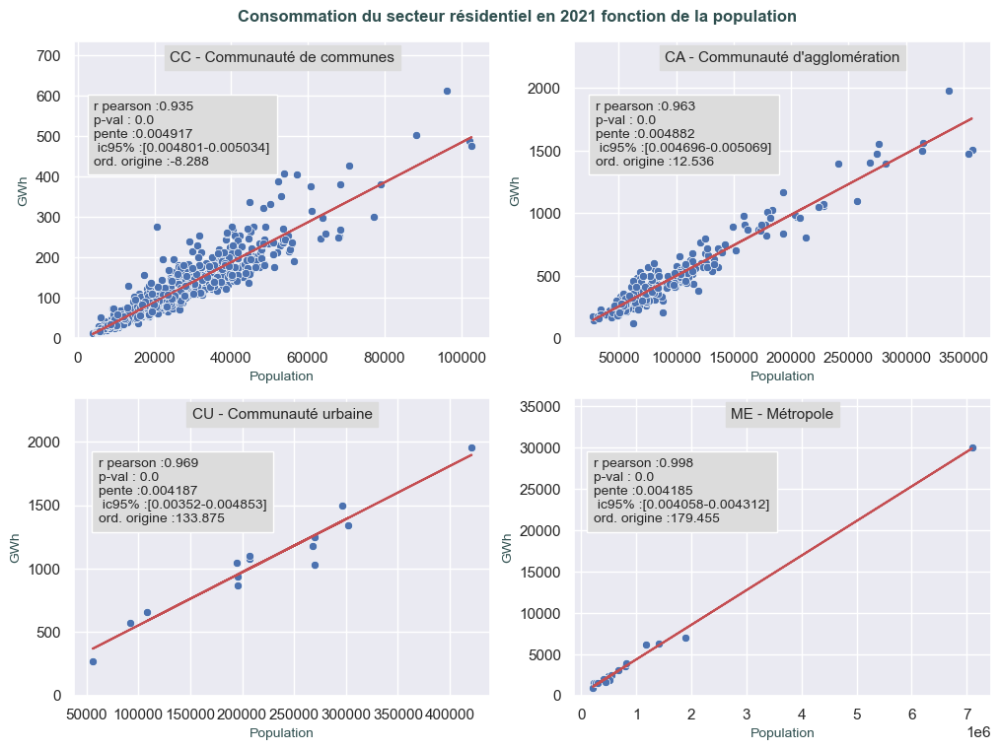

In [53]:
#Graphe avec population
#Les graphiques entre consommation du secteur résidentiel et polulation sont présentés de manière
#décomposé pour la commodité de la lecture : la métriopole du Grand-Paris et les métropoles en général écarsent tout
fig=plt.figure(figsize=(12,8))
for i in range(df_epci.shape[0]):
    plt.subplot(2,2,i+1)
    df=conso_epci_2021[conso_epci_2021["nature_epci"]==df_epci["nature_epci"][i]]
    var_x="population"
    var_y="conso_resid"
    nb_ddl=df.shape[0]-2
    sns.scatterplot(df,x=var_x,y=var_y,color='#4c72b0')
    titre=df_epci["nature_epci"][i]+" - "+df_epci["nom_nature_epci"][i]
    plt.title(titre,size=11,pad=-15,backgroundcolor=couleur_boite)
    plt.xlabel("Population",color=couleur_texte,size=10)
    plt.ylabel("GWh",color=couleur_texte,size=10)
    plt.ylim([0,1.2*df[var_y].max()])
    #Régression linéaire
    coeffcorr,pval=pearsonr(df[var_y],df[var_x])
    reg = LinearRegression()
    x=np.array(df[var_x]).reshape(-1,1)
    y=np.array(df[var_y]).reshape(-1,1)
    reg.fit(x,y)
    ymod=reg.coef_*x+reg.intercept_
    plt.plot(x,reg.coef_*x+reg.intercept_,color='r',linewidth=1.5)
    sx=np.sqrt(np.sum((x-x.mean())**2))
    sy=np.sqrt(np.sum((y-ymod)**2)/nb_ddl)
    ic95=sy/sx*t.ppf(1-0.025,nb_ddl,0,1)
    ic95max=reg.coef_[0][0]+ic95
    ic95min=reg.coef_[0][0]-ic95
    texte1="r pearson :"+ str(coeffcorr.round(3))
    texte2="p-val : "+ str(pval.round(3))
    texte3="pente :"+ str((reg.coef_[0][0]).round(6))
    texte4=" ic95% :"+"["+str(ic95min.round(6))+"-"+str(ic95max.round(6))+"]"
    texte5="ord. origine :"+ str((reg.intercept_[0]).round(3));
    texte=texte1+"\n"+texte2+"\n"+texte3+"\n"+texte4+"\n"+texte5
    plt.text(df[var_x].min()*1.1,df[var_y].max()*0.7,texte,fontweight = 'light',
             bbox={'facecolor': couleur_boite, 'alpha': 1, 'pad': 5} ,size=10);
plt.subplots_adjust(top=0.94)
plt.suptitle("Consommation du secteur résidentiel en 2021 fonction de la population",size=12,color=couleur_texte,weight="bold");

#Modèle global
df=conso_epci_2021
var_x="population"
var_y="conso_resid"


#Image
fig.savefig("énergie_graphe_6") 

                   valeur
r pearson         0.98000
p-value           0.00000
pente             0.00444
ord.à l'origine -51.88300


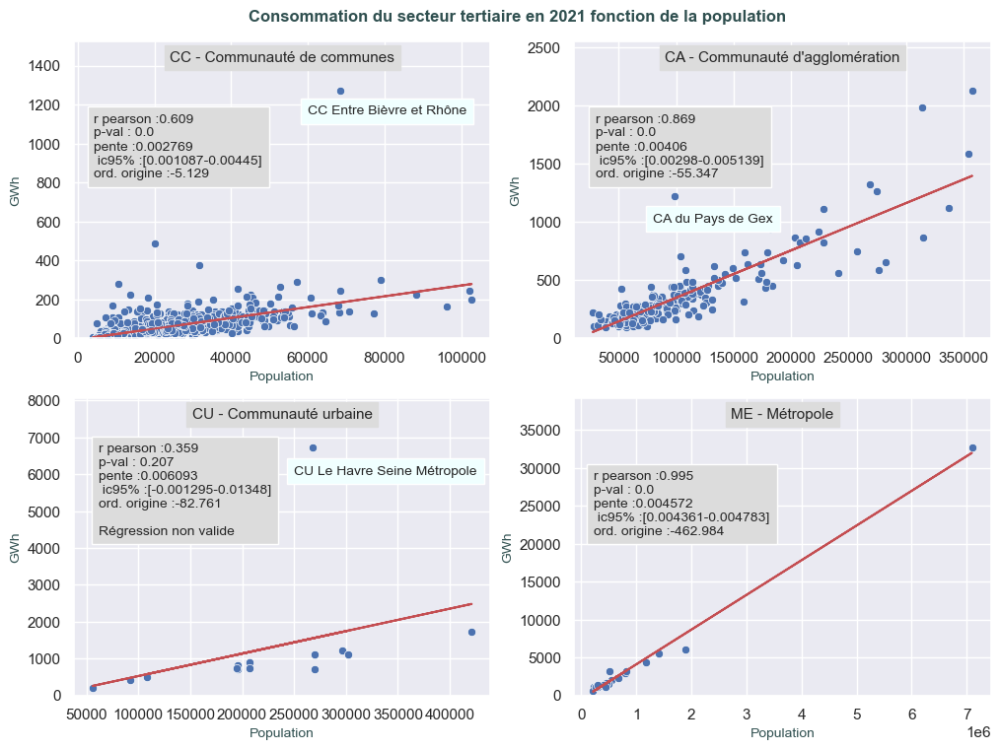

In [36]:
#Les graphiques entre consommation totale et polulation sont présentés de manière
#décomposé pour la commodité de la lecture : la métriopole du Grand-Paris et les métropoles en général écarsent tout
fig=plt.figure(figsize=(12,8))
for i in range(df_epci.shape[0]):
    plt.subplot(2,2,i+1)
    df=conso_epci_2021[conso_epci_2021["nature_epci"]==df_epci["nature_epci"][i]]
    var_x="population"
    var_y="conso_ter"
    graf=sns.scatterplot(df,x=var_x,y=var_y,color='#4c72b0')
    plt.ylim([0,1.2*df[var_y].max()])
    titre=df_epci["nature_epci"][i]+" - "+df_epci["nom_nature_epci"][i]
    plt.title(titre,size=11,pad=-15,backgroundcolor=couleur_boite)
    plt.xlabel("Population",color=couleur_texte,size=10)
    plt.ylabel("GWh",color=couleur_texte,size=10)
    #Régression linéaire
    coeffcorr,pval=pearsonr(df[var_y],df[var_x])
    reg = LinearRegression()
    x=np.array(df[var_x]).reshape(-1,1)
    y=np.array(df[var_y]).reshape(-1,1)
    reg.fit(x,y)
    ymod=reg.coef_*x+reg.intercept_
    plt.plot(x,reg.coef_*x+reg.intercept_,color='r',linewidth=1.5)
    sx=np.sqrt(np.sum((x-x.mean())**2))
    sy=np.sqrt(np.sum((y-ymod)**2)/nb_ddl)
    ic95=sy/sx*t.ppf(1-0.025,nb_ddl,0,1)
    ic95max=reg.coef_[0][0]+ic95
    ic95min=reg.coef_[0][0]-ic95
    texte1="r pearson :"+ str(coeffcorr.round(3))
    texte2="p-val : "+ str(pval.round(3))
    texte3="pente :"+ str((reg.coef_[0][0]).round(6))
    texte4=" ic95% :"+"["+str(ic95min.round(6))+"-"+str(ic95max.round(6))+"]"
    texte5="ord. origine :"+ str((reg.intercept_[0]).round(3));
    texte6="Régression non valide"
    if df_epci["nature_epci"][i]=="CU":
        texte=texte1+"\n"+texte2+"\n"+texte3+"\n"+texte4+"\n"+texte5+"\n\n"+texte6
    else:    
        texte=texte1+"\n"+texte2+"\n"+texte3+"\n"+texte4+"\n"+texte5
    #    
    plt.text(df[var_x].min()*1.1,df[var_y].max()*0.65,texte,fontweight = 'light',
             bbox={'facecolor': couleur_boite, 'alpha': 1, 'pad': 5} ,size=10);
    if df_epci["nature_epci"][i]=="CU":
        texte5="CU Le Havre Seine Métropole"
        plt.text(250000,6000,texte5,fontweight = 'light',
             bbox={'facecolor': 'azure', 'alpha': 1, 'pad': 5} ,size=10);
        texte6="Régression non valide"
    if df_epci["nature_epci"][i]=="CC":
        texte5="CC Entre Bièvre et Rhône"
        plt.text(60000,1150,texte5,fontweight = 'light',
             bbox={'facecolor': 'azure', 'alpha': 1, 'pad': 5} ,size=10); 
    if df_epci["nature_epci"][i]=="CA":
        texte5="CA du Pays de Gex"
        plt.text(80000,1000,texte5,fontweight = 'light',
             bbox={'facecolor': 'azure', 'alpha': 1, 'pad': 5} ,size=10);     
    plt.subplots_adjust(top=0.94)
plt.suptitle("Consommation du secteur tertiaire en 2021 fonction de la population",size=12,color=couleur_texte,weight="bold");

#Modèle global
df=conso_epci_2021
var_x="population"
var_y="conso_ter"

coeffcorr,pval=pearsonr(df[var_y],df[var_x])
reg = LinearRegression()
x=np.array(df[var_x]).reshape(-1,1)
y=np.array(df[var_y]).reshape(-1,1)
reg.fit(x,y)
r=coeffcorr.round(3)
p_val=pval.round(3)
pente=reg.coef_[0][0].round(6)
ord_orig=reg.intercept_[0].round(3)

df_reg_globale=pd.DataFrame({"r pearson":r,"p-value":p_val,"pente":pente,"ord.à l'origine":ord_orig},index=["valeur"])
print(df_reg_globale.T)

#Image
fig.savefig("énergie_graphe_7") 

In [37]:
#2 cas particuliers à analyser à partir du fichier de détail
#CU Le Havre Seine Métropole
#CC Entre Bièvre et Rhône  ,CC Porte du Jura

In [38]:
verif_CU=conso_communes_2021[conso_communes_2021["nom_epci"]=="CU Le Havre Seine Métropole"]
verif_CU[["code_commune","libelle_commune","conso_totale","conso_resid","conso_ter"]].sort_values(by="conso_ter",ascending=False).head(5)

,code_commune,libelle_commune,conso_totale,conso_resid,conso_ter
371790,76305,Gonfreville-l'Orcher,1.383800e+07,32791.295186,5.692371e+06
371833,76351,Le Havre,2.380429e+06,703071.063410,7.304530e+05
372129,76660,Sandouville,5.640894e+05,3111.253883,6.980070e+04
371927,76447,Montivilliers,1.719490e+05,78710.556432,6.216915e+04
371823,76341,Harfleur,7.880021e+04,36756.883256,2.454310e+04


In [39]:
verif_CC=conso_communes_2021[conso_communes_2021["nom_epci"]=="CC Entre Bièvre et Rhône"]
verif_CC[["code_commune","libelle_commune","conso_totale","conso_resid","conso_ter"]].sort_values(by="conso_ter",ascending=False).head(5)

,code_commune,libelle_commune,conso_totale,conso_resid,conso_ter
356674,38468,Salaise-sur-Sanne,1.828333e+06,21344.308960,1.142828e+06
356279,38034,Beaurepaire,1.472531e+05,19767.095940,2.830348e+04
356558,38344,Roussillon,1.321346e+05,34296.304210,2.003059e+04
356517,38298,Le Péage-de-Roussillon,4.383733e+04,23582.965841,1.929646e+04
356635,38425,Saint-Maurice-l'Exil,4.744078e+04,27293.061969,1.440250e+04


In [40]:
#On décide d'ajouter des indicateurs rapportés à la population en MWh par hab
#Objectif décorréler autant que possible de la population et de la nature de 'EPCI'
variables=["conso_totale","conso_resid","conso_ter","conso_indus","conso_agri"]
for var in variables:
    var1=var.split("_")[1]+"_hab"
    conso_epci_2021[var1]=1000*conso_epci_2021[var]/conso_epci_2021["population"]
        

In [41]:
#Description statistique rapide des nouvelles variables    
conso_epci_2021[["totale_hab","resid_hab","ter_hab","indus_hab","agri_hab"]].describe()

#2 variables ont des valeurs qui vont au-delà de 30 MWh/hab : le total et le secteur industriel
#On se doute que le total par habitant est corrélé à l'industriel par habitant
#par construction

#Les distributions ne sont pas de type "normal".On les explicitera dans deux cas

,totale_hab,resid_hab,ter_hab,indus_hab,agri_hab
count,1231.000000,1231.000000,1231.000000,1231.000000,1231.000000
mean,12.838940,4.497579,2.690356,5.291179,0.267213
std,12.686286,1.028150,2.062547,12.007134,0.453062
min,3.839207,1.901206,0.443531,0.019850,0.000000
25%,7.377408,3.793795,1.561598,0.827814,0.061704
50%,10.203659,4.359193,2.262713,2.173955,0.150227
75%,13.412266,4.991465,3.303765,4.959130,0.329135
max,205.847641,13.364929,26.573566,194.257443,8.544908


In [42]:
#Vérification de la "décorrélation" entre consommation par habitant et population
df=conso_epci_2021

variables=["totale_hab","resid_hab","ter_hab","indus_hab","agri_hab"]
var1="population"
for j in range(len(variables)):
    var2=variables[j]
    if j==0:
        corr_consohab_pop=statbiv.analyse_quanti_quanti(df,var1,var2)      
    else:
        corr_consohab_pop=pd.concat([corr_consohab_pop,statbiv.analyse_quanti_quanti(df,var1,var2)],axis=0)

#Reécriture
corr_consohab_pop=corr_consohab_pop.reset_index()
corr_consohab_pop=corr_consohab_pop.rename({"Variables":"Secteur"},axis=1)



corr_consohab_pop["Secteur"]=corr_consohab_pop["Secteur"].replace(to_replace=["population & totale_hab","population & resid_hab",
                                                                        "population & ter_hab", "population & indus_hab","population & agri_hab"],
                       value=["Total","Résidentiel","Tertiaire","Industriel","Agricole"])

        

In [43]:
#Traitement à faire : pour chaque Test de corrélation isoler la ligne de corrélation max 
#Puis modifier le dataframe de manière à avoir uniquement le test retenu pour chaque modalité de Secteur

for i in corr_consohab_pop.index:
    #introduire une colonne des valeurs absolues des corrélations
    corr_consohab_pop["Test de corrélation"][i]["Valeur_test"]=abs(corr_consohab_pop["Test de corrélation"][i]["Corrélation"])
    corr_consohab_pop["Test de corrélation"][i]=corr_consohab_pop["Test de corrélation"][i].sort_values(by="Valeur_test",axis=0, ascending=False,ignore_index=True)

#Modification    
nouv_colonnes=list(corr_consohab_pop["Test de corrélation"][0].columns)

for var in nouv_colonnes:
    valeurs=[]
    for i in range(len(corr_consohab_pop)):
        valeurs.append(corr_consohab_pop["Test de corrélation"][i][var][0])
    
    corr_consohab_pop[var]=valeurs 
    
#On nettoie : suppression des colonnes "Test de corrélation" et "Graphique"
corr_consohab_pop= corr_consohab_pop.drop(["Test de corrélation","Graphique","Valeur_test"],axis=1)

#Mise au format des colonnes numériques
corr_consohab_pop["Corrélation"]=corr_consohab_pop["Corrélation"].round(3)    

In [44]:
#Visualisation du tableau
corr_consohab_pop

,Secteur,Type,Corrélation,P-value,Interprétation,Significativité
0,Total,Spearman,0.399,0.0,Faible,Oui
1,Résidentiel,Spearman,0.398,0.0,Faible,Oui
2,Tertiaire,Spearman,0.421,0.0,Modérée,Oui
3,Industriel,Spearman,0.348,0.0,Faible,Oui
4,Agricole,Spearman,-0.288,0.0,Faible,Oui


In [45]:
#Impression image tableau correlation
image=imptab.impression_tableau(corr_consohab_pop,"Corrélation entre consommation ,par habitant et par secteur , et population")
image.write_image("énergie_tabl4.png")

In [46]:
#Corrélation entre les variables secteur
df=conso_epci_2021
variables=["totale_hab","resid_hab","ter_hab","indus_hab","agri_hab"]

#Boucle analyse bivariée quanti-quanti
var1_init=variables[0]
var2_init=variables[1]
couple_init=var1_init+" & "+var2_init
corr_consohab=statbiv.analyse_quanti_quanti(df,var1_init,var2_init)
for i in range(len(variables)-1):
    var1=variables[i]
    for j in range(i+1,len(variables)):
        var2=variables[j]
        couple=var1+" & "+var2
        if couple!=couple_init:
            corr_consohab=pd.concat([corr_consohab,statbiv.analyse_quanti_quanti(df,var1,var2)],axis=0)



In [47]:
#Traitement à faire : pour chaque Test de corrélation isoler la ligne de corrélation max 
#Puis modifier le dataframe de manière à avoir uniquement le test retenu pour chaque modalité de Secteur

for i in corr_consohab.index:
    #introduire une colonne des valeurs absolues des corrélations
    corr_consohab["Test de corrélation"][i]["Valeur_test"]=abs(corr_consohab["Test de corrélation"][i]["Corrélation"])
    corr_consohab["Test de corrélation"][i]=corr_consohab["Test de corrélation"][i].sort_values(by="Valeur_test",axis=0, ascending=False,ignore_index=True)

#Modification    
nouv_colonnes=list(corr_consohab["Test de corrélation"][0].columns)

for var in nouv_colonnes:
    valeurs=[]
    for i in range(len(corr_consohab)):
        valeurs.append(corr_consohab["Test de corrélation"][i][var][0])
    
    corr_consohab[var]=valeurs 
    
#On nettoie : suppression des colonnes "Test de corrélation" et "Graphique"
corr_consohab= corr_consohab.drop(["Test de corrélation","Graphique","Valeur_test"],axis=1)

#Mise au format des colonnes numériques
corr_consohab["Corrélation"]=corr_consohab["Corrélation"].round(3)    


In [49]:
#Visualisation du tableau
corr_consohab["Valeur_test"]=abs(corr_consohab["Corrélation"])
corr_consohab=corr_consohab.sort_values(by="Valeur_test",axis=0, ascending=False)
corr_consohab=corr_consohab.drop(["Valeur_test"],axis=1)
corr_consohab=corr_consohab.reset_index()

#Réécriture finale pour avoir 2 colonnes de secteurs
corr_consohab["Secteur 1"]=corr_consohab["Variables"].apply(lambda x: x.split(" & ")[0])
corr_consohab["Secteur 2"]=corr_consohab["Variables"].apply(lambda x : x.split(" & ")[1])
corr_consohab=corr_consohab.drop(["Variables"],axis=1)

corr_consohab=corr_consohab.replace(to_replace=["totale_hab","resid_hab","ter_hab", "indus_hab","agri_hab"],
                       value=["Total","Résidentiel","Tertiaire","Industriel","Agricole"])

#Réarrangement des colonnes
cols=corr_consohab.columns.tolist()
cols=cols[-2:]+cols[:-2]
corr_consohab=corr_consohab.reindex(cols, axis=1)

corr_consohab

,Secteur 1,Secteur 2,Type,Corrélation,P-value,Interprétation,Significativité
0,Total,Industriel,Pearson,0.979,0.0000,Très forte,Oui
1,Total,Tertiaire,Spearman,0.643,0.0000,Forte,Oui
2,Résidentiel,Tertiaire,Spearman,0.535,0.0000,Modérée,Oui
3,Total,Résidentiel,Spearman,0.526,0.0000,Modérée,Oui
4,Résidentiel,Agricole,Spearman,-0.408,0.0000,Modérée,Oui
5,Tertiaire,Industriel,Spearman,0.339,0.0000,Faible,Oui
6,Tertiaire,Agricole,Spearman,-0.263,0.0000,Faible,Oui
7,Résidentiel,Industriel,Spearman,0.222,0.0000,Faible,Oui
8,Total,Agricole,Spearman,-0.107,0.0002,Très faible,Oui
9,Industriel,Agricole,Spearman,0.014,0.6251,Très faible,Non


In [50]:
#Image du tableau
#Impression image tableau correlation
image=imptab.impression_tableau(corr_consohab,"Corrélation entre secteurs pour la consommation par habitant")
image.write_image("énergie_tabl5.png")


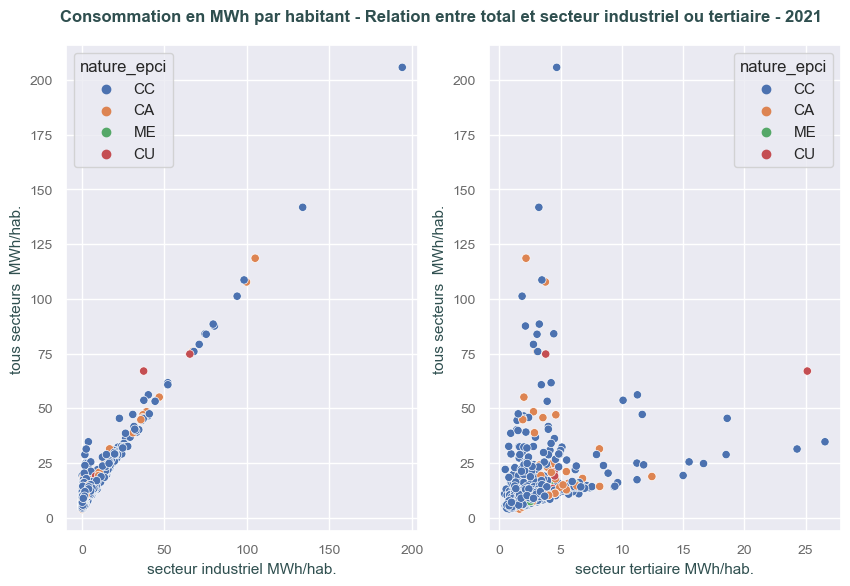

In [77]:
#Graphesde relation entre total par habitant et résidentiel ou industriel par habitant
fig,ax=plt.subplots(1,2,figsize=(10,6))

variables=["indus_hab","ter_hab"]
label_axe_x=["secteur industriel MWh/hab.","secteur tertiaire MWh/hab."]
for i in range(2):
    sns.scatterplot(conso_epci_2021,x=variables[i],y="totale_hab",color='#4c72b0',hue="nature_epci",ax=ax[i])
    #df.plot.scatter(x=variables[i],y="totale_hab",ax=ax[i])
    ax[i].set_xlabel(label_axe_x[i],size=11,color=couleur_texte)
    ax[i].set_ylabel("tous secteurs  MWh/hab.",size=11,color=couleur_texte)
    plt.draw()
    labely=[item.get_text() for item in ax[i].get_yticklabels(which='both')]
    ax[i].set_yticklabels(labely,color=couleur_axes,size=10)
    labelx=[item.get_text() for item in ax[i].get_xticklabels(which='both')]
    ax[i].set_xticklabels(labelx,color=couleur_axes,size=10)
#    
plt.subplots_adjust(top=0.92)
plt.suptitle("Consommation en MWh par habitant - Relation entre total et secteur industriel ou tertiaire - 2021",
             size=12,color=couleur_texte,weight="bold");

#Image
fig.savefig("énergie_graphe_8") 


In [47]:
#récupération des contours epci
contour_epci=gpd.read_file("C:\DATA\contours_cartes\contour_epci_simplifié.geojson")


In [207]:
#Préparation des cartes

In [48]:
#Sélection de colonnes et croisement avec des données sélectionnées
contour_epci=contour_epci[["code_epci","geometry"]]

#Données sélectionnées
df=conso_epci_2021[["code_epci","nom_epci","population","totale_hab","resid_hab","ter_hab","indus_hab","agri_hab"]]

#croisement
df_carte=contour_epci.merge(right=df,on="code_epci",how="left")

In [49]:
#Ajout de classes pour les 3 cartes

couleurs=["lightgray","lightskyblue","plum","greenyellow","yellowgreen","gold","orangered"]

nomclasse_1=["1 - moins de 5 ","2 - de 5 à 10","3 - de 10 à 15", "4 - de 15 à 25","5 - de 25 à 50",
             "6 - de 50 à 100","7 - de 100 à 205"]
labelclasse_1=list(["moins de 5 ","de 5 à 10","de 10 à 15", "de 15 à 25","de 25 à 50","de 50 à 100","de 100 à 205"])
classe_1=[-10,5,10,15,25,50,100,1000]

nomclasse_2=["1 - moins de 2 ","2 - de 2 à 4","3 - de 4 à 6","4 - de 6 à 8","5 - de 8 à 10","6 - de 10 à 12","7 - de 12 à 14"]
classe_2=[-10,2,4,6,8,10,12,100]

nomclasse_3=["1 - moins de 2 ","2 - de 2 à 4","3 - de 4 à 6","4 - de 6 à 8","5 - de 8 à 10","6 - de 10 à 12","7 - de 12 à 14"]
classe_3=[-10,2,4,6,8,10,12,100]


nomclasse_4=["1 - moins de 2 ","2 - de 2 à 4","3 - de 4 à 8","4 - de 8 à 16","5 - de 16 à 50","6 - de 50 à 100","7 -de 100 à 200"]
classe_4 =[-10,2,4,8,16,50,100,1000]

nomclasse_5=["1 - moins de 0.5 ","2 - de 0.5 à 1","3 - de 1 à 2","4 - de 2 à 4","5 - de 4 à 6","6 - de 6 à 8","7 - de 8 à 10"]
classe_5 =[-10,0.5,1,2,4,6,8,1000]


couleurs=["lightgray","lightskyblue","plum","greenyellow","yellowgreen","gold","orangered"]

df_carte["classe_totale_hab"]=pd.cut(df_carte["totale_hab"],bins=classe_1,labels=nomclasse_1)
df_carte["classe_resid_hab"]=pd.cut(df_carte["resid_hab"],bins=classe_2,labels=nomclasse_2)
df_carte["classe_ter_hab"]=pd.cut(df_carte["ter_hab"],bins=classe_3,labels=nomclasse_3)
df_carte["classe_indus_hab"]=pd.cut(df_carte["indus_hab"],bins=classe_4,labels=nomclasse_4)
df_carte["classe_agri_hab"]=pd.cut(df_carte["agri_hab"],bins=classe_5,labels=nomclasse_5)


df_carte_1=df_carte[[ 'geometry', 'nom_epci','classe_totale_hab']]
df_carte_2=df_carte[[ 'geometry', 'nom_epci','classe_resid_hab']]
df_carte_3=df_carte[[ 'geometry', 'nom_epci','classe_ter_hab']]
df_carte_4=df_carte[[ 'geometry', 'nom_epci','classe_indus_hab']]
df_carte_5=df_carte[[ 'geometry', 'nom_epci','classe_agri_hab']]

#préparation exports pour mapbox
df_carte_1_bis=df_carte[[ 'geometry', 'nom_epci','classe_totale_hab',"totale_hab"]]
df_carte_2_bis=df_carte[[ 'geometry', 'nom_epci','classe_resid_hab',"resid_hab"]]
df_carte_3_bis=df_carte[[ 'geometry', 'nom_epci','classe_ter_hab',"ter_hab"]]
df_carte_4_bis=df_carte[[ 'geometry', 'nom_epci','classe_indus_hab',"indus_hab"]]
df_carte_5_bis=df_carte[[ 'geometry', 'nom_epci','classe_agri_hab',"agri_hab"]]

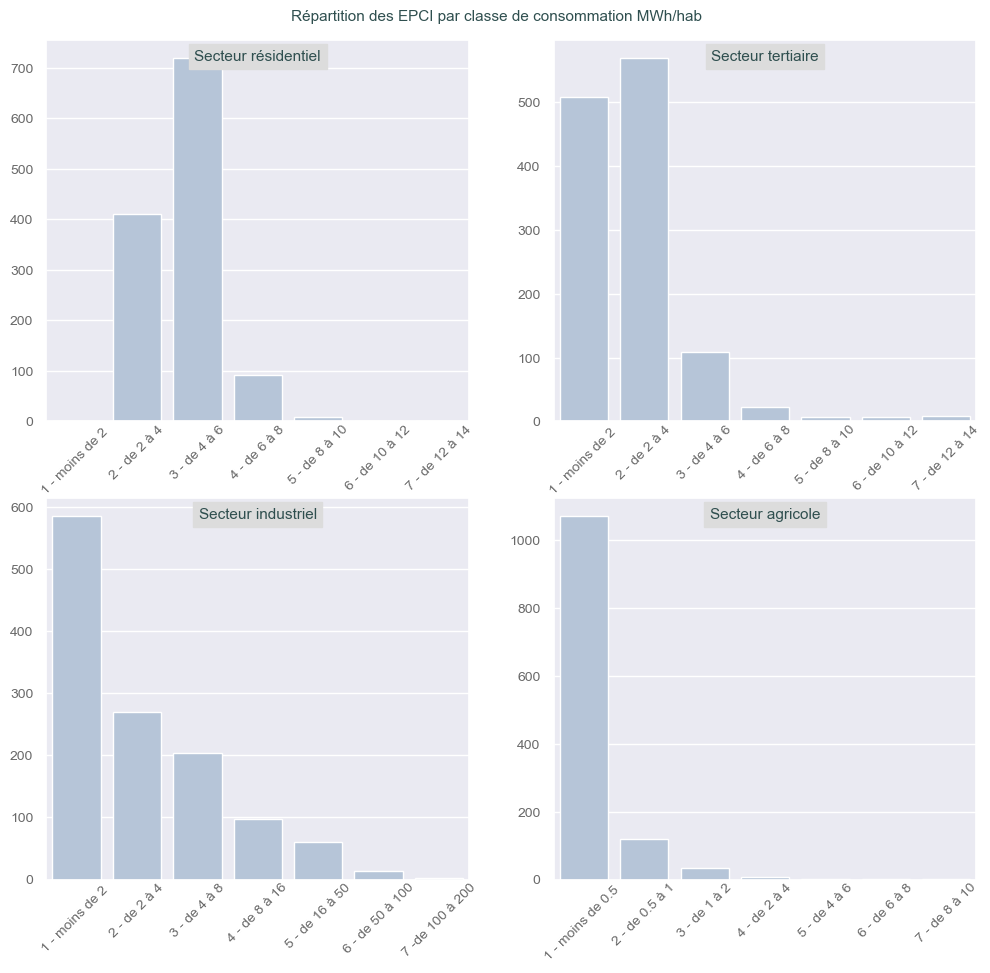

In [50]:
#Les 4 graphes sur une même figure
df=df_carte
variables=["classe_totale_hab","classe_resid_hab","classe_ter_hab","classe_indus_hab","classe_agri_hab"]
libelles=["Tous secteurs","Secteur résidentiel","Secteur tertiaire","Secteur industriel","Secteur agricole"]
nlig=2
ncol=2
fig,ax=plt.subplots(nlig,ncol,figsize=(12,10))
for i in range(len(variables)-1):
    var=variables[i+1]
    k=int(i/ncol)
    l=np.mod(i,ncol)
    graf=ax[k][l]
    sns.countplot(df,x=var, color="lightsteelblue",ax=graf)
    graf.set_title(libelles[i+1],color=couleur_texte,size=11,pad=-15,backgroundcolor=couleur_boite)        
    graf.set_xlabel("")    
    graf.set_ylabel("")
    plt.draw()
    labelx=[item.get_text() for item in graf.get_xticklabels(which='both')]
    labely=[item.get_text() for item in graf.get_yticklabels(which='both')]
    graf.set_xticklabels(labelx,rotation=45,color=couleur_axes,size=10,y=0.03)
    graf.set_yticklabels(labely,color=couleur_axes,size=10)
    
plt.subplots_adjust(top=0.95)
plt.suptitle("Répartition des EPCI par classe de consommation MWh/hab",color=couleur_texte,size=11);

In [51]:
#Lister les cas extrêmes
df_classement=df_carte[["nom_epci","totale_hab","resid_hab","ter_hab","indus_hab","agri_hab"]]


In [52]:
df_classement.sort_values(by="totale_hab",ascending=False).reset_index(drop=True)[["nom_epci","totale_hab"]].head(5)

,nom_epci,totale_hab
0,CC Cœur de Maurienne Arvan,205.847641
1,CC Brie Nangissienne,141.859631
2,CA Saint-Avold Synergie,118.576790
3,CC du Bassin de Pont-à-Mousson,108.637898
4,CA Caux Seine Agglo,107.714782


In [53]:
df_classement.sort_values(by="resid_hab",ascending=False).reset_index(drop=True) [["nom_epci","resid_hab"]].head(5)

,nom_epci,resid_hab
0,CC Cœur Côte Fleurie,13.364929
1,CC de la Vallée de Chamonix-Mont-Blanc,9.873538
2,CC de l'Île de Ré,8.967074
3,CC Gally Mauldre,8.838873
4,CC Pyrénées catalanes,8.661549


In [54]:
df_classement.sort_values(by="ter_hab",ascending=False).reset_index(drop=True) [["nom_epci","ter_hab"]].head(5)

,nom_epci,ter_hab
0,CC Porte du Jura,26.573566
1,CU Le Havre Seine Métropole,25.130702
2,CC du Val de l'Aisne,24.295201
3,CC Entre Bièvre et Rhône,18.593983
4,CC Val Vanoise,18.504959


In [55]:
df_classement.sort_values(by="indus_hab",ascending=False).reset_index(drop=True) [["nom_epci","indus_hab"]].head(5)

,nom_epci,indus_hab
0,CC Cœur de Maurienne Arvan,194.257443
1,CC Brie Nangissienne,133.874055
2,CA Saint-Avold Synergie,105.039909
3,CA Caux Seine Agglo,99.782330
4,CC du Bassin de Pont-à-Mousson,98.298393


In [56]:
df_classement.sort_values(by="agri_hab",ascending=False).reset_index(drop=True) [["nom_epci","agri_hab"]].head(5)

,nom_epci,agri_hab
0,"CC Chinon, Vienne et Loire",8.544908
1,CC du Sammiellois,7.735458
2,CC Haut-Léon Communauté,4.021126
3,CC Cœur Haute Lande,2.563522
4,CC du Grand Saint-Émilionnais,2.501395


In [57]:
conso_industriel=df_carte_4_bis[["nom_epci","geometry","classe_indus_hab","indus_hab"]]
conso_industriel['classe_indus_hab']=conso_industriel['classe_indus_hab'].astype("str")
conso_industriel['classe_indus_hab']=conso_industriel['classe_indus_hab'].apply(lambda x:x.split("-")[1])
conso_industriel.to_file(r"C:\DATA\énergie\conso_france_industriel.json")

In [58]:
conso_totale=df_carte_1_bis[["nom_epci","geometry","classe_totale_hab","totale_hab"]]
conso_totale['classe_totale_hab']=conso_totale['classe_totale_hab'].astype("str")
conso_totale['classe_totale_hab']=conso_totale['classe_totale_hab'].apply(lambda x:x.split("-")[1])
conso_totale.to_file(r"C:\DATA\énergie\conso_france_totale.json")

In [59]:
conso_résidentiel=df_carte_2_bis[["nom_epci","geometry","classe_resid_hab","resid_hab"]]
conso_résidentiel['classe_resid_hab']=conso_résidentiel['classe_resid_hab'].astype("str")
conso_résidentiel['classe_resid_hab']=conso_résidentiel['classe_resid_hab'].apply(lambda x:x.split("-")[1])
conso_résidentiel.to_file(r"C:\DATA\énergie\conso_france_résidentiel.json")

In [60]:
conso_tertiaire=df_carte_3_bis[["nom_epci","geometry","classe_ter_hab","ter_hab"]]
conso_tertiaire['classe_ter_hab']=conso_tertiaire['classe_ter_hab'].astype("str")
conso_tertiaire['classe_ter_hab']=conso_tertiaire['classe_ter_hab'].apply(lambda x:x.split("-")[1])
conso_tertiaire.to_file(r"C:\DATA\énergie\conso_france_tertiaire.json")

In [61]:
conso_agricole=df_carte_5_bis[["nom_epci","geometry","classe_agri_hab","agri_hab"]]
conso_agricole['classe_agri_hab']=conso_agricole['classe_agri_hab'].astype("str")
conso_agricole['classe_agri_hab']=conso_agricole['classe_agri_hab'].apply(lambda x:x.split("-")[1])
conso_agricole.to_file(r"C:\DATA\énergie\conso_france_agricole.json")

In [62]:
#Préparation carte1  carte explore
couleurs=["lightgray","lightskyblue","plum","greenyellow","yellowgreen","gold","orangered"]  #pour explore
kargs={"location":[47.0,1.7],"zoom_start":6}

carte_1=df_carte_1.explore(
    column="classe_totale_hab",
    legend=True,
    legend_kwds={"caption":"Total en MWh / hab."},
    cmap=couleurs,
    style_kwds={"color":"gray","opacity":0.2,"fillOpacity":1},
    map_kwds={"scrollWheelZoom":False},  
    control_scale=True,
    **kargs   
)

#ajout d'un titre  --> couleur du titre à changer
titre_1 ="Consommation totale en MWh/habitant - Electricité/Gaz naturel 2021"
titre_html_1 = '''
             <h3 align="center" style="font-size:14px"><b>{}</b></h3>
             '''.format(titre_1)   
carte_1.get_root().html.add_child(folium.Element(titre_html_1))

carte_1

In [63]:
#Préparation carte1  carte explore
couleurs=["lightgray","lightskyblue","plum","greenyellow","yellowgreen","gold","orangered"]  #pour explore
kargs={"location":[47.0,1.7],"zoom_start":6}

carte_2=df_carte_2.explore(
    column="classe_resid_hab",
    legend=True,
    legend_kwds={"caption":"Résidentiel en MWh / hab."},
    cmap=couleurs,
    style_kwds={"color":"gray","opacity":0.2,"fillOpacity":1},
    map_kwds={"scrollWheelZoom":False},  
    control_scale=True,
    **kargs   
)

#ajout d'un titre  --> couleur du titre à changer
titre_2 ="Consommation secteur résidentiel en MWh/habitant - Electricité/Gaz naturel 2021"
titre_html_2 = '''
             <h3 align="center" style="font-size:14px"><b>{}</b></h3>
             '''.format(titre_2)   
carte_2.get_root().html.add_child(folium.Element(titre_html_2))

carte_2

In [64]:
#Préparation carte3  carte explore
couleurs=["lightgray","lightskyblue","plum","greenyellow","yellowgreen","gold","orangered"]  #pour explore
kargs={"location":[47.0,1.7],"zoom_start":6}

carte_3=df_carte_3.explore(
    column="classe_ter_hab",
    legend=True,
    legend_kwds={"caption":"Tertiaire en MWh / hab."},
    cmap=couleurs,
    style_kwds={"color":"gray","opacity":0.2,"fillOpacity":1},
    map_kwds={"scrollWheelZoom":False},  
    control_scale=True,
    **kargs   
)

#ajout d'un titre  --> couleur du titre à changer
titre_3 ="Consommation secteur tertiaire en MWh/habitant - Electricité/Gaz naturel 2021"
titre_html_3 = '''
             <h3 align="center" style="font-size:14px"><b>{}</b></h3>
             '''.format(titre_3)   
carte_3.get_root().html.add_child(folium.Element(titre_html_3))

carte_3

In [65]:
#Préparation carte4  carte explore
couleurs=["lightgray","lightskyblue","plum","greenyellow","yellowgreen","gold","orangered"]  #pour explore
kargs={"location":[47.0,1.7],"zoom_start":6}

carte_4=df_carte_4.explore(
    column="classe_indus_hab",
    legend=True,
    legend_kwds={"caption":"Industriel en MWh / hab."},
    cmap=couleurs,
    style_kwds={"color":"gray","opacity":0.2,"fillOpacity":1},
    map_kwds={"scrollWheelZoom":False},  
    control_scale=True,
    **kargs   
)

#ajout d'un titre  --> couleur du titre à changer
titre_4 ="Consommation secteur industriel en MWh/habitant - Electricité/Gaz naturel 2021"
titre_html_4 = '''
             <h3 align="center" style="font-size:14px"><b>{}</b></h3>
             '''.format(titre_4)   
carte_4.get_root().html.add_child(folium.Element(titre_html_4))

carte_4

In [66]:
#Préparation carte5  carte explore
couleurs=["lightgray","lightskyblue","plum","greenyellow","yellowgreen","gold","orangered"]  #pour explore
kargs={"location":[47.0,1.7],"zoom_start":6}

carte_5=df_carte_5.explore(
    column="classe_agri_hab",
    legend=True,
    legend_kwds={"caption":"Agricole en MWh / hab."},
    cmap=couleurs,
    style_kwds={"color":"gray","opacity":0.2,"fillOpacity":1},
    map_kwds={"scrollWheelZoom":False},  
    control_scale=True,
    **kargs   
)

#ajout d'un titre  --> couleur du titre à changer
titre_5 ="Consommation secteur agricole en MWh/habitant - Electricité/Gaz naturel 2021"
titre_html_5 = '''
             <h3 align="center" style="font-size:14px"><b>{}</b></h3>
             '''.format(titre_5)   
carte_5.get_root().html.add_child(folium.Element(titre_html_5))

carte_5

In [67]:
#Préparation exportation pour la suite de l'étude sur le secteur industriel
df_indus=df_carte[['code_epci', 'geometry', 'nom_epci', 'population', 'indus_hab', 'classe_indus_hab']]
df_indus['classe_indus_hab']=df_indus['classe_indus_hab'].astype("str")
df_indus['classe_indus_hab']=df_indus['classe_indus_hab'].apply(lambda x:x.split("-")[1])


In [68]:
#Réinjection des données secteur industriels
df_conso_indus= conso_epci_2021[["code_epci","conso_indus_gaz","conso_indus_elec","conso_indus"]]

df_indus=df_indus.merge(right=df_conso_indus,on="code_epci",how="left")

#vérif valeurs manquantes
df_indus.isna().sum()

#Aucun problème

code_epci           0
geometry            0
nom_epci            0
population          0
indus_hab           0
classe_indus_hab    0
conso_indus_gaz     0
conso_indus_elec    0
conso_indus         0
dtype: int64

In [69]:
df_indus.to_file(r"C:\DATA\énergie\énergie_industriel.json")

In [70]:
#FIN PROVISOIRE


In [71]:
df_carte_2.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 1231 entries, 0 to 1230
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   geometry          1231 non-null   geometry
 1   nom_epci          1231 non-null   object  
 2   classe_resid_hab  1231 non-null   category
dtypes: category(1), geometry(1), object(1)
memory usage: 20.9+ KB
